<a href="https://colab.research.google.com/github/Karolya/AD_-/blob/main/ATT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Импортируем нужные библиотеки для работы с датафреймами, массивами данных, построения графиков, статистических тестов и работы с изображениями

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import norm, zscore, ttest_ind, chi2_contingency
import numpy as np
import warnings
import cv2
from urllib.request import urlopen
from google.colab.patches import cv2_imshow
from statsmodels.tsa.arima.model import ARIMA
warnings.filterwarnings('ignore')

# Задание 1
Провести первичный анализ и предобработку датафрейма
Nasdaq https://disk.yandex.ru/i/TLKCZALyC4e71g.

In [ ]:
data = pd.read_excel('Nasdaq.xlsx')
data.head()

,Unnamed: 0,Symbol,Name,Last Sale,Net Change,% Change,Market Cap,Country,IPO Year,Volume,Sector,Industry,Z
0,871,BAM,Brookfield Asset Management Inc. Common Stock,$45.52,-1.670,-3.539%,74720277027,Canada,1925,1563431,Consumer Discretionary,Other Consumer Services,BAM
1,2048,CVR,Chicago Rivet & Machine Co. Common Stock,$28.47,-0.020,-0.07%,27505778,United States,1930,882,Consumer Discretionary,Industrial Specialties,CVR
2,4491,LGL,LGL Group Inc. (The) Common Stock,$11.435,-0.065,-0.565%,61296974,United States,1946,1509,Technology,Industrial Machinery/Components,LGL
3,1526,CET,Central Securities Corporation Common Stock,$35.75,-0.520,-1.434%,974773228,United States,1951,15250,Finance,Finance/Investors Services,CET
4,5166,NBR,Nabors Industries Ltd.,$161.03,-12.920,-7.427%,1515601156,Bermuda,1951,82194,Energy,Oil & Gas Production,NBR


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3905 entries, 0 to 3904
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  3905 non-null   int64  
 1   Symbol      3905 non-null   object 
 2   Name        3905 non-null   object 
 3   Last Sale   3905 non-null   object 
 4   Net Change  3905 non-null   float64
 5   % Change    3905 non-null   object 
 6   Market Cap  3905 non-null   int64  
 7   Country     3905 non-null   object 
 8   IPO Year    3905 non-null   int64  
 9   Volume      3905 non-null   int64  
 10  Sector      3905 non-null   object 
 11  Industry    3905 non-null   object 
 12  Z           3905 non-null   object 
dtypes: float64(1), int64(4), object(8)
memory usage: 396.7+ KB


In [ ]:
data.isnull().sum()

Unnamed: 0    0
Symbol        0
Name          0
Last Sale     0
Net Change    0
% Change      0
Market Cap    0
Country       0
IPO Year      0
Volume        0
Sector        0
Industry      0
Z             0
dtype: int64

In [ ]:
data.duplicated().sum()

0

Нулевых значений и дубликатов в датасете нет, выбросы считать не имеет смысла, так как данный датасет предназначен не для выборки

# Задание 2
Выбрать случайным образом компанию из списка Nasdaq:
Определить год IPO, страну, сектор и индустрию.


In [ ]:
np.random.seed(0)
num = np.random.randint(0, len(data)-1)
num

2732

In [ ]:
data.iloc[2732]

Unnamed: 0                                                  202
Symbol                                                     AFAC
Name          Arena Fortify Acquisition Corp. Class A Common...
Last Sale                                                 $9.99
Net Change                                                  0.0
% Change                                                  0.00%
Market Cap                                            215409375
Country                                           United States
IPO Year                                                   2021
Volume                                                       34
Sector                                            Miscellaneous
Industry                                  Other Pharmaceuticals
Z                                                          AFAC
Name: 2732, dtype: object

Год IPO - 2021
Страна - United States
Сектор - Miscellaneous
Индустрия - Other Pharmaceuticals


# Задание 3
Оценить степень связи между двумя категориальными
переменными: страной и индустрией.

In [ ]:
# Расчет коэффициента Хи-квадрат
observed = pd.crosstab(data['Country'], data['Industry'])
chi2, p_val, dof, expected = chi2_contingency(observed)

print("Коэффициент Хи-квадрат:", chi2)
print("p-значение:", p_val)

Коэффициент Хи-квадрат: 14138.045163038063
p-значение: 0.0


Коэффициент слишком велик - связь между данными переменными низкая

#Задание 4

Рассмотреть, как распределены доли рыночной стоимости
компаний из этого сектора. Сравнить с распределениями всех
остальных секторов.




In [ ]:
data['Sector'].value_counts()

Finance                   878
Industrials               858
Health Care               746
Consumer Discretionary    553
Technology                484
Real Estate               138
Energy                     85
Utilities                  64
Consumer Staples           39
Telecommunications         25
Miscellaneous              24
Basic Materials            11
Name: Sector, dtype: int64

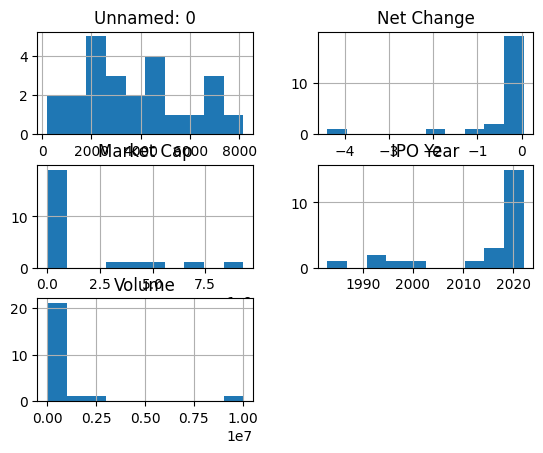

In [ ]:
data[data['Sector'] == 'Miscellaneous'].hist()
None

In [ ]:
data[data['Sector'] == 'Miscellaneous'].describe()

,Unnamed: 0,Net Change,Market Cap,IPO Year,Volume
count,24.000000,24.000000,2.400000e+01,24.000000,2.400000e+01
mean,3724.083333,-0.418679,1.278412e+09,2014.083333,7.503623e+05
std,2148.146540,0.957299,2.527172e+09,11.758130,2.055879e+06
min,202.000000,-4.390000,0.000000e+00,1983.000000,1.000000e+00
25%,2314.750000,-0.335000,2.446372e+07,2014.500000,1.924325e+04
50%,3345.000000,-0.028150,1.184460e+08,2020.000000,1.026425e+05
75%,4959.000000,0.000000,4.027586e+08,2021.000000,6.539650e+05
max,8152.000000,0.045000,9.299141e+09,2022.000000,1.002318e+07


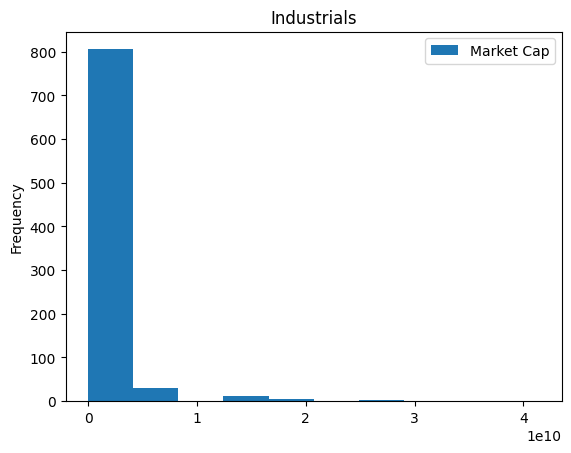

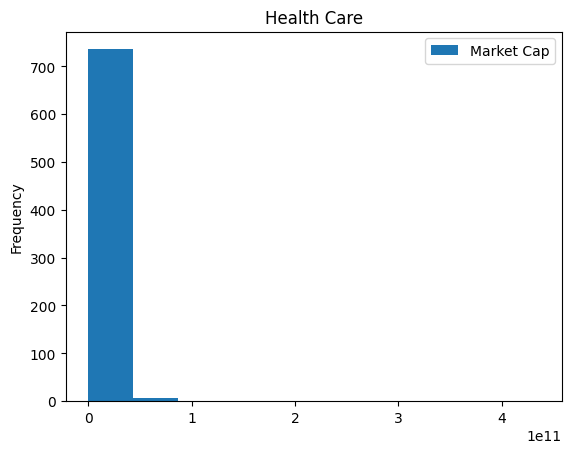

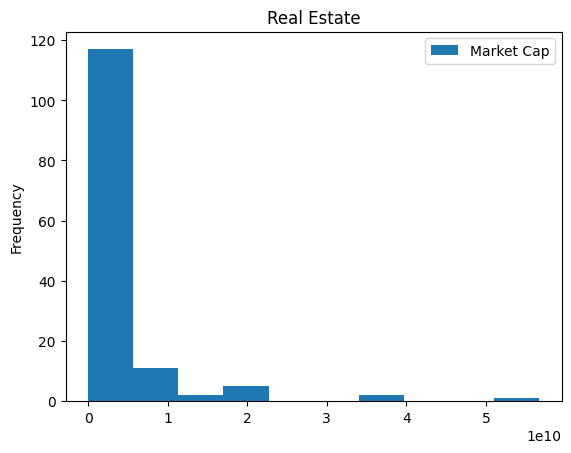

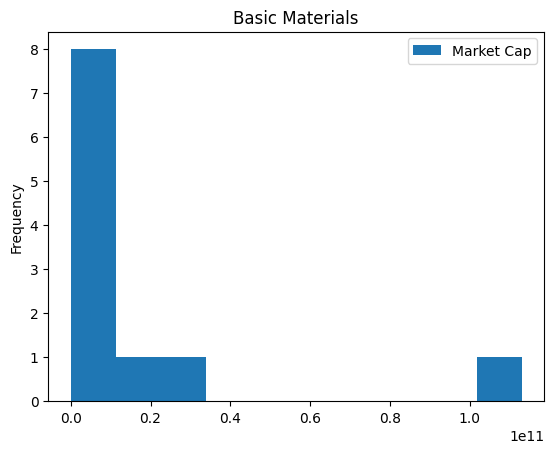

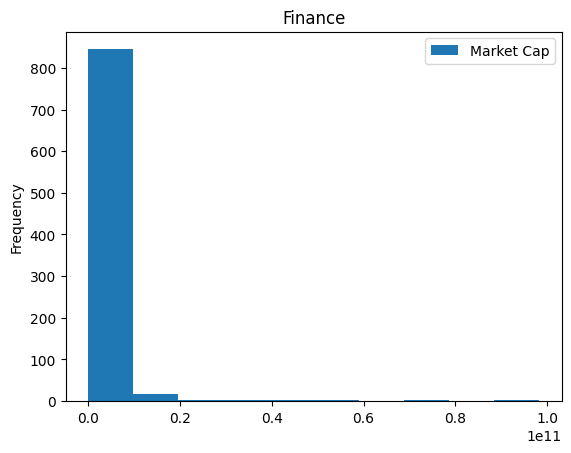

...

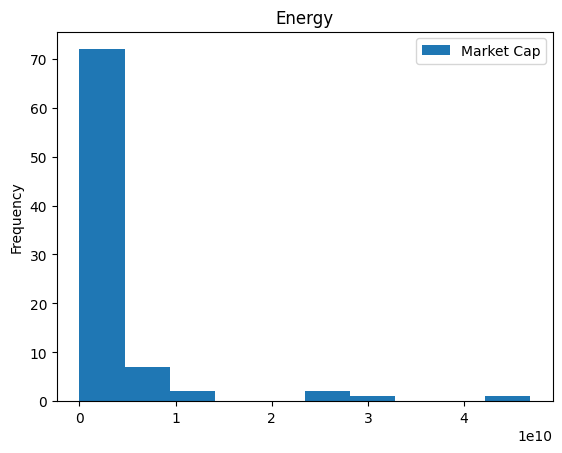

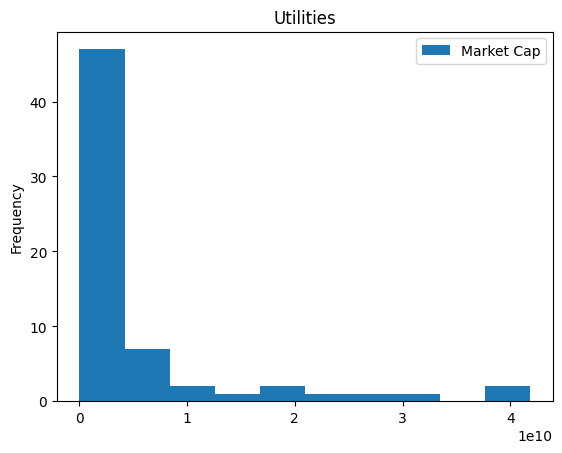

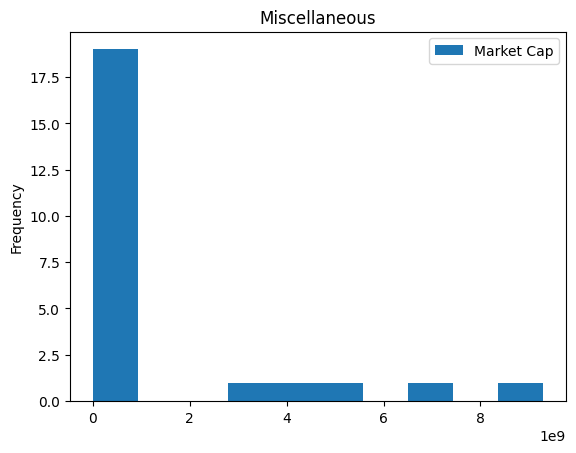

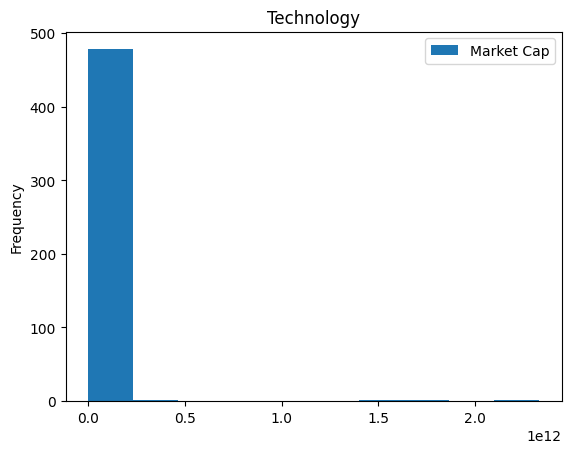

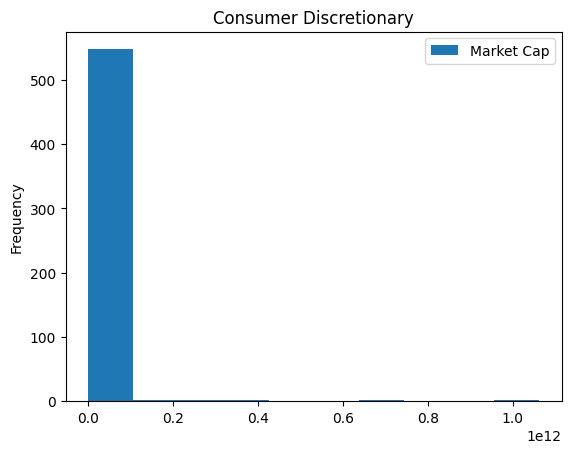

In [ ]:
for i in set(data['Sector'].values):
  # data[data['Sector'] == i].hist()
  # plt.title(f'{i}')
  ax = data[['Market Cap']][data['Sector'] == i].plot(kind='hist' ,title=f'{i}')

Видно, что данные распределены, а не собраны в одной точки у выбранного сектора

#Задание 5
Провести анализ курса акций компании за все время с момента
выхода на рынок.

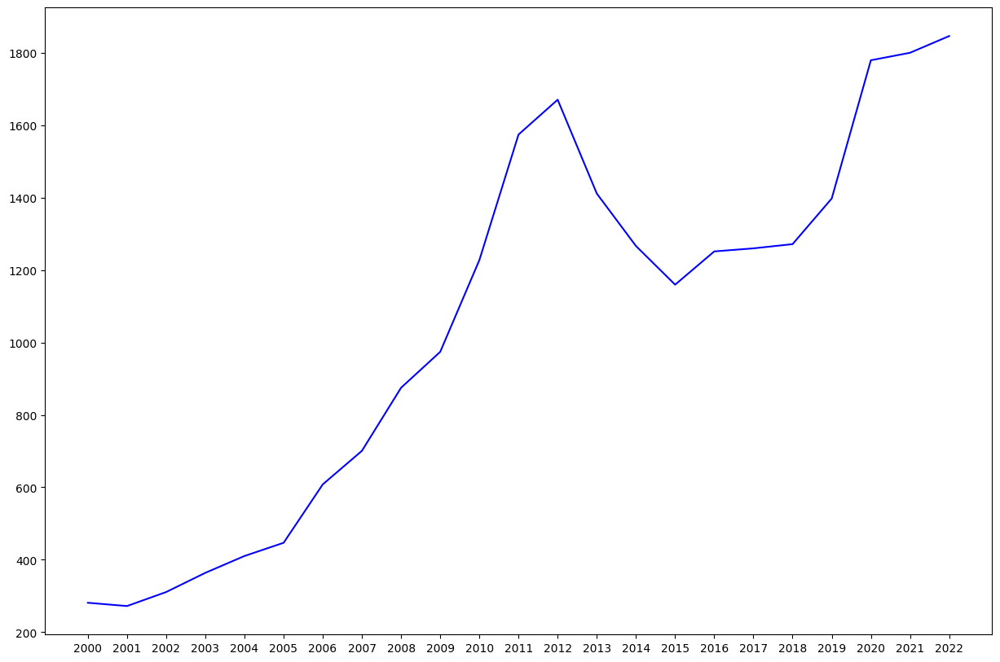

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
data_g = pd.read_csv('gold.csv')
data_g['Date_y'] = data_g['Date'].apply(lambda x: x[:4])
plt.plot(sorted(list(set(data_g['Date_y']))), data_g.groupby('Date_y')['Open'].mean(), color='blue')

#Задание 6
Рассчитать индекс индустрии за последние 20 лет (можно
меньше) на основе 10 крупнейших компаний. Сравнить динамику
индекса и курса акций выбранной компании

Соберем всё в массив объемов и рассчитаем индекс для каждого года

In [ ]:
volume_arr = data_g.groupby('Date_y').mean()['Volume'].to_numpy()
index = [100]

In [ ]:
for i in range(2, len(volume_arr)):
  index_change = (volume_arr[i] - volume_arr[i - 1]) / volume_arr[i - 1] * 100
  index.append(index[-1] + index_change)
for y, index_value in enumerate(index):
 print(f"{2000 + y} год: Индекс = {index_value:.2f}")

2000 год: Индекс = 100.00
2001 год: Индекс = 135.55
2002 год: Индекс = 172.00
2003 год: Индекс = 198.52
2004 год: Индекс = 204.29
2005 год: Индекс = 201.81
2006 год: Индекс = 261.57
2007 год: Индекс = 321.08
2008 год: Индекс = 311.06
2009 год: Индекс = 336.74
2010 год: Индекс = 350.15
2011 год: Индекс = 338.54
2012 год: Индекс = 347.51
2013 год: Индекс = 333.17
2014 год: Индекс = 336.12
2015 год: Индекс = 374.05
2016 год: Индекс = 406.13
2017 год: Индекс = 414.46
2018 год: Индекс = 423.10
2019 год: Индекс = 410.91
2020 год: Индекс = 385.30
2021 год: Индекс = 376.35


#Задание 7
Сравнить динамику показателей мировой экономики (ВВП,
население, инфляция и т.д., не менее пяти) и динамику индекса.
Использовать данные:
https://datahub.io/collections/economic-data#other-economic-data-and
-indicator

In [ ]:
data_gdp = pd.read_csv('gdp_csv.csv')
data_surp = pd.read_csv('cash_surp_csv.csv')
data_inf = pd.read_csv('inflation-gdp_csv.csv')
data_pop = pd.read_csv('population_csv.csv')
data_cpi = pd.read_csv('cpi_csv.csv')

In [ ]:
data_gdp.head()

,Country Name,Country Code,Year,Value
0,Arab World,ARB,1968,2.576068e+10
1,Arab World,ARB,1969,2.843420e+10
2,Arab World,ARB,1970,3.138550e+10
3,Arab World,ARB,1971,3.642691e+10
4,Arab World,ARB,1972,4.331606e+10


In [ ]:
data_surp.head()

,Country Name,Country Code,Year,Value
0,Afghanistan,AFG,2006,-2.027860
1,Afghanistan,AFG,2007,-1.731230
2,Afghanistan,AFG,2008,-2.314250
3,Afghanistan,AFG,2009,0.281700
4,Afghanistan,AFG,2010,1.495567


In [ ]:
data_inf.head()

,Country,Country Code,Year,Inflation
0,Arab World,ARB,1969,1.303790
1,Arab World,ARB,1970,2.602241
2,Arab World,ARB,1971,6.884719
3,Arab World,ARB,1972,2.496081
4,Arab World,ARB,1973,11.555281


In [ ]:
data_pop.head()

,Country Name,Country Code,Year,Value
0,Arab World,ARB,1960,92197753
1,Arab World,ARB,1961,94724510
2,Arab World,ARB,1962,97334442
3,Arab World,ARB,1963,100034179
4,Arab World,ARB,1964,102832760


In [ ]:
data_cpi.head()

,Country Name,Country Code,Year,CPI
0,Afghanistan,AFG,2004,63.131893
1,Afghanistan,AFG,2005,71.140974
2,Afghanistan,AFG,2006,76.302178
3,Afghanistan,AFG,2007,82.774807
4,Afghanistan,AFG,2008,108.066600


In [ ]:
def world(x, yearr):
  index = [100]
  x_ = []
  y1 = []
  y2 = []
  for i in range(2, len(x)):
    index_change = (x[i] - x[i - 1]) / x[i - 1] * 100
    index.append(index[-1] + index_change)
  for y, index_value in enumerate(index):
    print(f"{yearr + y} год: Индекс = {index_value:.2f}, Значение = {x[y]}")
    x_.append(y)
    y1.append(f'{index_value:.2f}')
    y2.append(x[y])
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
  ax1.plot(x_, y1, color='blue')
  ax1.legend
  ax2.plot(x_, y2, color='red')
  ax2.legend


1960 год: Индекс = 100.00, Значение = 30698686335
1961 год: Индекс = 101.77, Значение = 31110850733
1962 год: Индекс = 103.94, Значение = 31661593019
1963 год: Индекс = 106.07, Значение = 32347009479
1964 год: Индекс = 108.21, Значение = 33037793472
1965 год: Индекс = 110.42, Значение = 33745614596
1966 год: Индекс = 112.58, Значение = 34491057057
1967 год: Индекс = 114.72, Значение = 35234108448
1968 год: Индекс = 116.93, Значение = 35990815150
1969 год: Индекс = 119.12, Значение = 36784905156
1970 год: Индекс = 121.32, Значение = 37590496505
1971 год: Индекс = 123.44, Значение = 38416767362
1972 год: Индекс = 125.51, Значение = 39232962760
1973 год: Индекс = 127.54, Значение = 40043773529
1974 год: Индекс = 129.49, Значение = 40857235871
1975 год: Индекс = 131.38, Значение = 41655228171
1976 год: Индекс = 133.22, Значение = 42440530715
1977 год: Индекс = 135.06, Значение = 43223000974
1978 год: Индекс = 136.92, Значение = 44018897749
1979 год: Индекс = 138.76, Значение = 44833833929


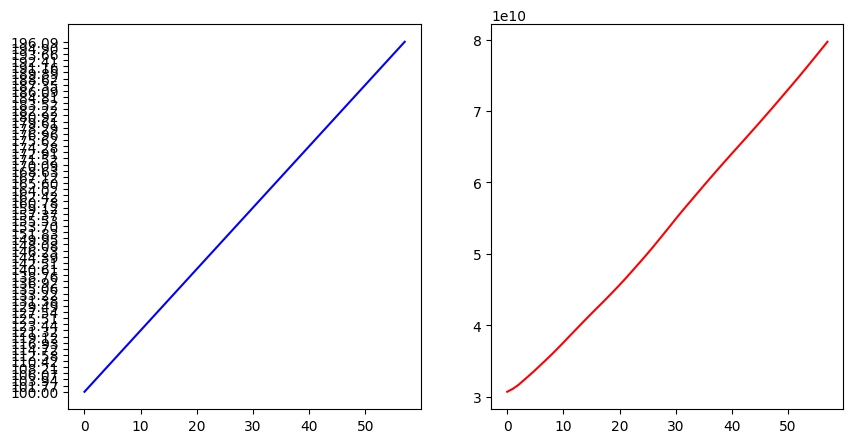

In [ ]:
world(data_pop.groupby('Year').sum()['Value'].to_numpy(), 1960)

1960 год: Индекс = 100.00, Значение = 435.76405724653034
1961 год: Индекс = 104.30, Значение = 451.2862744762212
1962 год: Индекс = 114.83, Значение = 470.70902513642227
1963 год: Индекс = 121.64, Значение = 520.2491480312896
1964 год: Индекс = 128.87, Значение = 555.671041978377
1965 год: Индекс = 139.51, Значение = 595.8451849077303
1966 год: Индекс = 144.24, Значение = 659.2391984401926
1967 год: Индекс = 148.12, Значение = 690.4205238348344
1968 год: Индекс = 154.56, Значение = 717.2500579223865
1969 год: Индекс = 159.50, Значение = 763.4089167113443
1970 год: Индекс = 164.97, Значение = 801.1687487009722
1971 год: Индекс = 173.19, Значение = 844.9305624591859
1972 год: Индекс = 183.08, Значение = 914.3840238441845
1973 год: Индекс = 200.66, Значение = 1004.80657669493
1974 год: Индекс = 213.42, Значение = 1181.5356993534995
1975 год: Индекс = 225.68, Значение = 1332.2248734162124
1976 год: Индекс = 239.21, Значение = 1495.6608570794158
1977 год: Индекс = 243.52, Значение = 1697.97

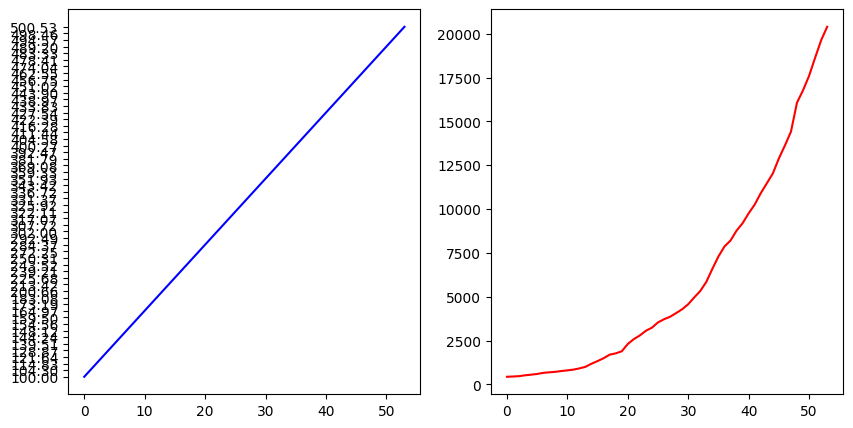

In [ ]:
world(data_cpi.groupby('Year').sum()['CPI'].to_numpy(), 1960)

1960 год: Индекс = 100.00, Значение = 405.88589975892984
1961 год: Индекс = 129.74, Значение = 588.3268148113231
1962 год: Индекс = 130.95, Значение = 763.3216972925757
1963 год: Индекс = 147.79, Значение = 772.5037095967189
1964 год: Индекс = 112.24, Значение = 902.6133327696393
1965 год: Индекс = 143.72, Значение = 581.7742617766435
1966 год: Индекс = 150.54, Значение = 764.9128819821456
1967 год: Индекс = 136.94, Значение = 817.0303099214503
1968 год: Индекс = 144.16, Значение = 705.9511740946092
1969 год: Индекс = 161.89, Значение = 756.9257547320269
1970 год: Индекс = 194.12, Значение = 891.1112634122941
1971 год: Индекс = 317.52, Значение = 1178.3090509592785
1972 год: Индекс = 380.92, Значение = 2632.3191910571422
1973 год: Индекс = 339.69, Значение = 4301.347602127831
1974 год: Индекс = 334.59, Значение = 2527.885038020818
1975 год: Индекс = 326.83, Значение = 2398.9913180806993
1976 год: Индекс = 313.37, Значение = 2212.6842041641794
1977 год: Индекс = 359.54, Значение = 1914.

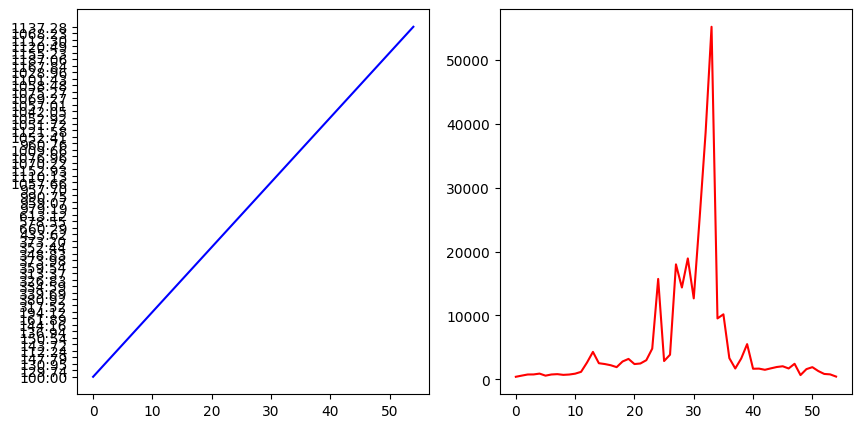

In [ ]:
world(data_inf.groupby('Year').sum()['Inflation'].to_numpy(), 1960)

1960 год: Индекс = 100.00, Значение = 41.23696996751
1961 год: Индекс = 79.35, Значение = 61.2499959367397
1962 год: Индекс = -19.81, Значение = 48.6044316557096
1963 год: Индекс = -24.94, Значение = 0.40640294235699814
1964 год: Индекс = -1724.25, Значение = 0.38556196364799833
1965 год: Индекс = -1472.20, Значение = -6.166332852971003
1966 год: Индекс = -1357.62, Значение = -21.708370658114198
1967 год: Индекс = -1373.62, Значение = -46.581672592144
1968 год: Индекс = -1360.68, Значение = -39.130674701747
1969 год: Индекс = -1295.23, Значение = -44.193524463887
1970 год: Индекс = -1266.05, Значение = -73.116239603454
1971 год: Индекс = -1298.90, Значение = -94.4576221838925
1972 год: Индекс = -1328.34, Значение = -63.427738777041
1973 год: Индекс = -1339.61, Значение = -44.7506344355965
1974 год: Индекс = -1364.16, Значение = -39.707525699382
1975 год: Индекс = -1447.11, Значение = -29.959996918053
1976 год: Индекс = -1637.22, Значение = -5.1093523392929985
1977 год: Индекс = -5454.4

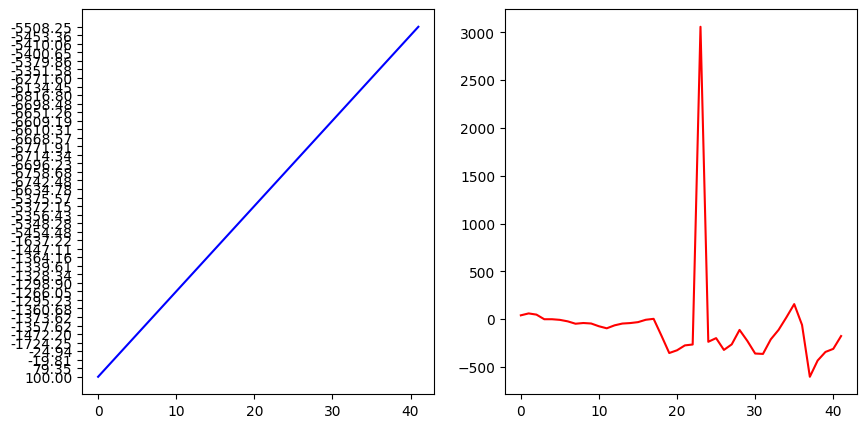

In [ ]:
world(data_surp.groupby('Year').sum()['Value'].to_numpy(), 1960)

1960 год: Индекс = 100.00, Значение = 9936119437850.63
1961 год: Индекс = 107.49, Значение = 10247532885636.88
1962 год: Индекс = 115.28, Значение = 11015547691138.41
1963 год: Индекс = 125.20, Значение = 11873455423114.768
1964 год: Индекс = 135.49, Значение = 13050573879032.654
1965 год: Индекс = 143.47, Значение = 14393803428507.088
1966 год: Индекс = 149.43, Значение = 15542600441244.03
1967 год: Индекс = 157.14, Значение = 16468862083231.174
1968 год: Индекс = 167.50, Значение = 17739127732371.53
1969 год: Индекс = 178.72, Значение = 19577201579296.54
1970 год: Индекс = 189.06, Значение = 21773358281404.773
1971 год: Индекс = 204.29, Значение = 24024474902034.61
1972 год: Индекс = 227.29, Значение = 27684241118314.883
1973 год: Индекс = 243.92, Значение = 34049006116163.32
1974 год: Индекс = 255.53, Значение = 39712728017503.65
1975 год: Индекс = 263.79, Значение = 44321798089779.7
1976 год: Индекс = 276.81, Значение = 47983214193582.88
1977 год: Индекс = 293.57, Значение = 542315

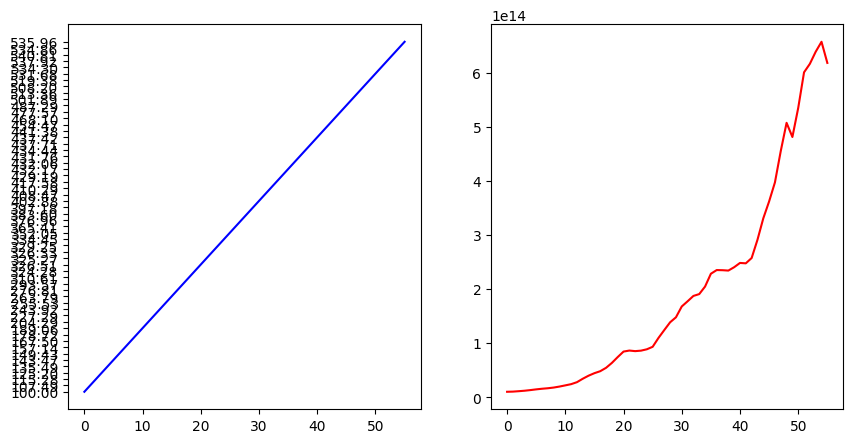

In [ ]:
world(data_gdp.groupby('Year').sum()['Value'].to_numpy(), 1960)

#Задание 8
Сравнить курс акций компании и динамику показателей
национальной экономики (не менее пяти). Использовать данные:
https://microdata.worldbank.org/index.php/catalog/history/


In [ ]:
data_n = pd.read_csv('nifty_it_index.csv')
data_n.head()

,Date,Open,High,Low,Close,Volume,Turnover
0,2015-01-01,11214.80,11235.75,11166.35,11215.70,4246150,3.575100e+09
1,2015-01-02,11214.65,11399.10,11214.65,11372.10,10004862,9.645600e+09
2,2015-01-05,11369.35,11433.75,11186.95,11248.55,8858018,1.059000e+10
3,2015-01-06,11186.10,11186.10,10909.00,10959.90,12515739,1.364500e+10
4,2015-01-07,11013.20,11042.35,10889.55,10916.00,10976356,1.203440e+10


0 год: Индекс = 100.00, Значение = 11214.8
1 год: Индекс = 101.38, Значение = 11214.65
2 год: Индекс = 99.77, Значение = 11369.35
3 год: Индекс = 98.22, Значение = 11186.1
4 год: Индекс = 98.38, Значение = 11013.2
5 год: Индекс = 98.63, Значение = 11031.15
6 год: Индекс = 102.23, Значение = 11058.05
7 год: Индекс = 103.01, Значение = 11456.0
8 год: Индекс = 103.15, Значение = 11545.25
9 год: Индекс = 104.11, Значение = 11561.95
10 год: Индекс = 104.42, Значение = 11672.3
11 год: Индекс = 104.62, Значение = 11708.85
12 год: Индекс = 104.19, Значение = 11732.5
13 год: Индекс = 104.62, Значение = 11681.8
14 год: Индекс = 105.48, Значение = 11732.45
15 год: Индекс = 105.86, Значение = 11832.55
16 год: Индекс = 106.18, Значение = 11877.9
17 год: Индекс = 104.47, Значение = 11915.6
18 год: Индекс = 105.32, Значение = 11712.55
19 год: Индекс = 106.90, Значение = 11812.35
20 год: Индекс = 105.84, Значение = 11998.35
21 год: Индекс = 106.62, Значение = 11871.35
22 год: Индекс = 107.15, Значение

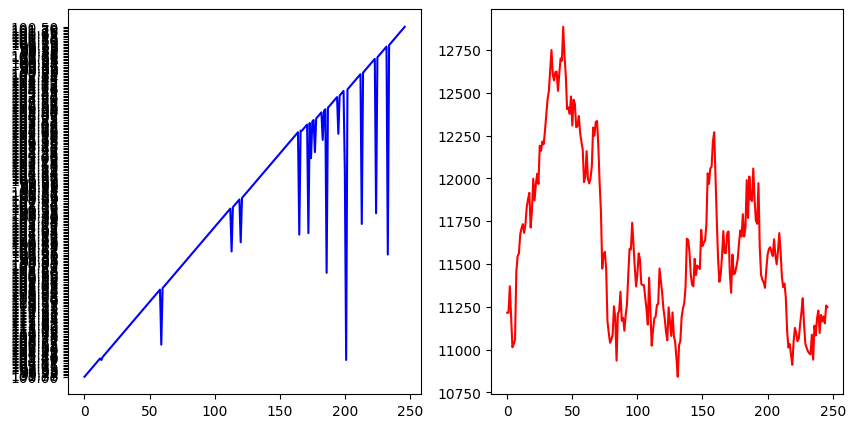

In [ ]:
world(data_n['Open'], 0)

0 год: Индекс = 100.00, Значение = 11215.7
1 год: Индекс = 98.91, Значение = 11372.1
2 год: Индекс = 96.35, Значение = 11248.55
3 год: Индекс = 95.95, Значение = 10959.9
4 год: Индекс = 96.88, Значение = 10916.0
5 год: Индекс = 100.35, Значение = 11018.15
6 год: Индекс = 101.61, Значение = 11399.65
7 год: Индекс = 101.25, Значение = 11543.65
8 год: Индекс = 102.22, Значение = 11502.8
9 год: Индекс = 102.70, Значение = 11614.3
10 год: Индекс = 102.61, Значение = 11669.85
11 год: Индекс = 102.47, Значение = 11659.6
12 год: Индекс = 102.92, Значение = 11642.75
13 год: Индекс = 103.93, Значение = 11695.0
14 год: Индекс = 104.25, Значение = 11813.7
15 год: Индекс = 104.54, Значение = 11850.85
16 год: Индекс = 102.92, Значение = 11885.15
17 год: Индекс = 103.92, Значение = 11693.45
18 год: Индекс = 104.04, Значение = 11809.55
19 год: Индекс = 104.05, Значение = 11824.15
20 год: Индекс = 105.05, Значение = 11824.75
21 год: Индекс = 105.22, Значение = 11943.95
22 год: Индекс = 105.01, Значение

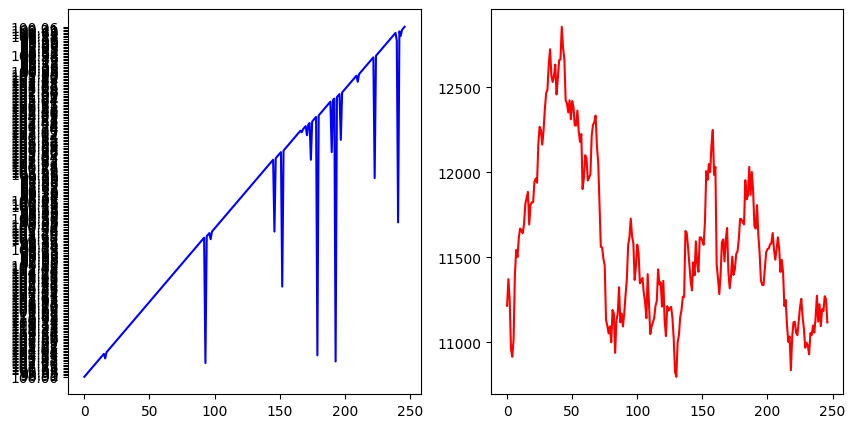

In [ ]:
world(data_n['Close'], 0)

0 год: Индекс = 100.00, Значение = 11166.35
1 год: Индекс = 99.75, Значение = 11214.65
2 год: Индекс = 97.27, Значение = 11186.95
3 год: Индекс = 97.09, Значение = 10909.0
4 год: Индекс = 97.32, Значение = 10889.55
5 год: Индекс = 97.48, Значение = 10915.05
6 год: Индекс = 101.57, Значение = 10932.2
7 год: Индекс = 102.09, Значение = 11378.8
8 год: Индекс = 102.81, Значение = 11437.95
9 год: Индекс = 103.28, Значение = 11521.0
10 год: Индекс = 103.35, Значение = 11575.1
11 год: Индекс = 103.75, Значение = 11582.85
12 год: Индекс = 103.81, Значение = 11629.05
13 год: Индекс = 104.01, Значение = 11635.7
14 год: Индекс = 105.07, Значение = 11659.7
15 год: Индекс = 104.94, Значение = 11782.95
16 год: Индекс = 104.19, Значение = 11767.4
17 год: Индекс = 104.31, Значение = 11679.55
18 год: Индекс = 104.61, Значение = 11693.8
19 год: Индекс = 105.21, Значение = 11728.75
20 год: Индекс = 105.62, Значение = 11799.35
21 год: Индекс = 105.63, Значение = 11847.8
22 год: Индекс = 106.08, Значение =

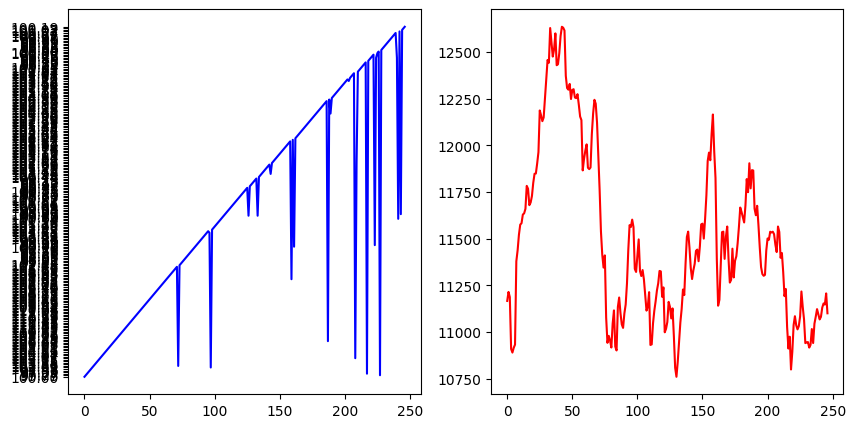

In [ ]:
world(data_n['Low'], 0)

0 год: Индекс = 100.00, Значение = 11235.75
1 год: Индекс = 100.30, Значение = 11399.1
2 год: Индекс = 98.14, Значение = 11433.75
3 год: Индекс = 96.85, Значение = 11186.1
4 год: Индекс = 97.00, Значение = 11042.35
5 год: Индекс = 100.86, Значение = 11058.15
6 год: Индекс = 101.56, Значение = 11484.9
7 год: Индекс = 101.39, Значение = 11565.85
8 год: Индекс = 102.13, Значение = 11546.6
9 год: Индекс = 103.36, Значение = 11631.55
10 год: Индекс = 102.80, Значение = 11774.5
11 год: Индекс = 103.56, Значение = 11708.85
12 год: Индекс = 102.92, Значение = 11797.6
13 год: Индекс = 103.91, Значение = 11721.9
14 год: Индекс = 104.30, Значение = 11838.3
15 год: Индекс = 104.61, Значение = 11884.5
16 год: Индекс = 104.58, Значение = 11921.0
17 год: Индекс = 103.78, Значение = 11917.25
18 год: Индекс = 104.11, Значение = 11821.8
19 год: Индекс = 105.31, Значение = 11861.5
20 год: Индекс = 105.05, Значение = 12003.35
21 год: Индекс = 105.28, Значение = 11972.6
22 год: Индекс = 105.51, Значение = 

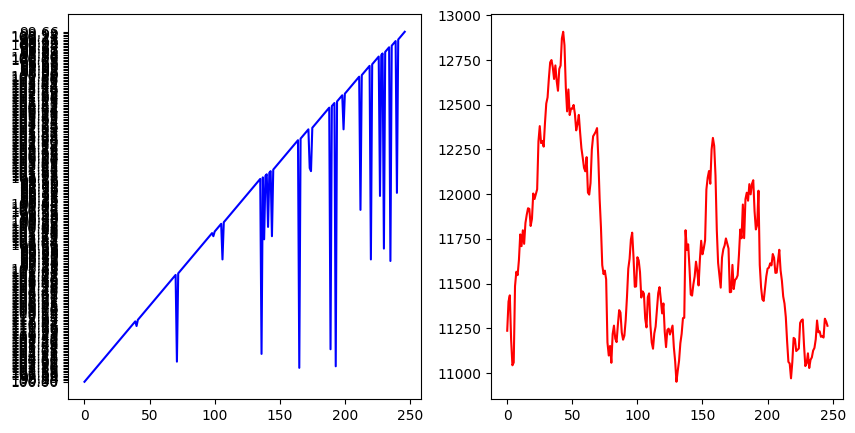

In [ ]:
world(data_n['High'], 0)

0 год: Индекс = 100.00, Значение = 4246150
1 год: Индекс = 88.54, Значение = 10004862
2 год: Индекс = 129.83, Значение = 8858018
3 год: Индекс = 117.53, Значение = 12515739
4 год: Индекс = 135.74, Значение = 10976356
5 год: Индекс = 226.97, Значение = 12975117
6 год: Индекс = 193.49, Значение = 24812224
7 год: Индекс = 169.29, Значение = 16505074
8 год: Индекс = 169.56, Значение = 12511358
9 год: Индекс = 180.22, Значение = 12544558
10 год: Индекс = 169.31, Значение = 13882213
11 год: Индекс = 180.05, Значение = 12368107
12 год: Индекс = 160.52, Значение = 13696381
13 год: Индекс = 230.00, Значение = 11021415
14 год: Индекс = 214.14, Значение = 18679282
15 год: Индекс = 305.25, Значение = 15715515
16 год: Индекс = 261.87, Значение = 30034833
17 год: Индекс = 261.12, Значение = 17005337
18 год: Индекс = 253.08, Значение = 16876897
19 год: Индекс = 272.66, Значение = 15520902
20 год: Индекс = 265.72, Значение = 18559078
21 год: Индекс = 287.62, Значение = 17272113
22 год: Индекс = 256.27

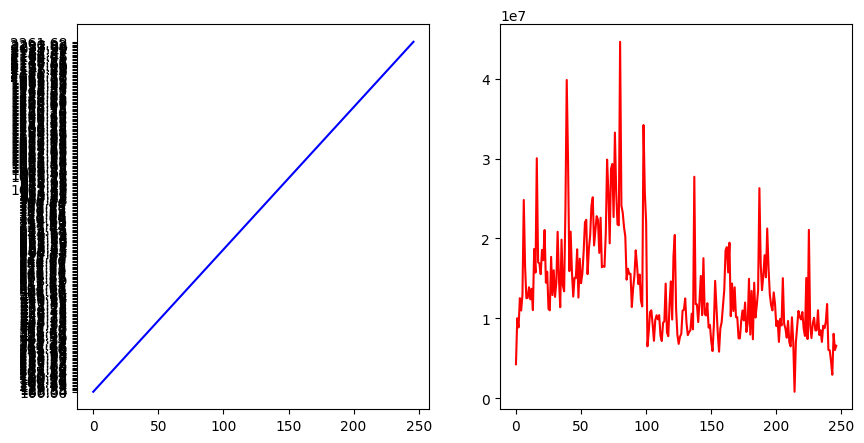

In [ ]:
world(data_n['Volume'], 0)

# Задание 9
Сделать предсказание курса акций с помощью модели ARIMA,
на следующие две недели. Подобрать наилучшие параметры
модели.

In [ ]:
data_fn = data_n[['Date', 'Open']]
data_fn

,Date,Open
0,2015-01-01,11214.80
1,2015-01-02,11214.65
2,2015-01-05,11369.35
3,2015-01-06,11186.10
4,2015-01-07,11013.20
...,...,...
243,2015-12-24,11193.25
244,2015-12-28,11152.70
245,2015-12-29,11257.05
246,2015-12-30,11247.35


In [ ]:
model = ARIMA(data_fn['Open'], order=(10, 1, 10))
results = model.fit()

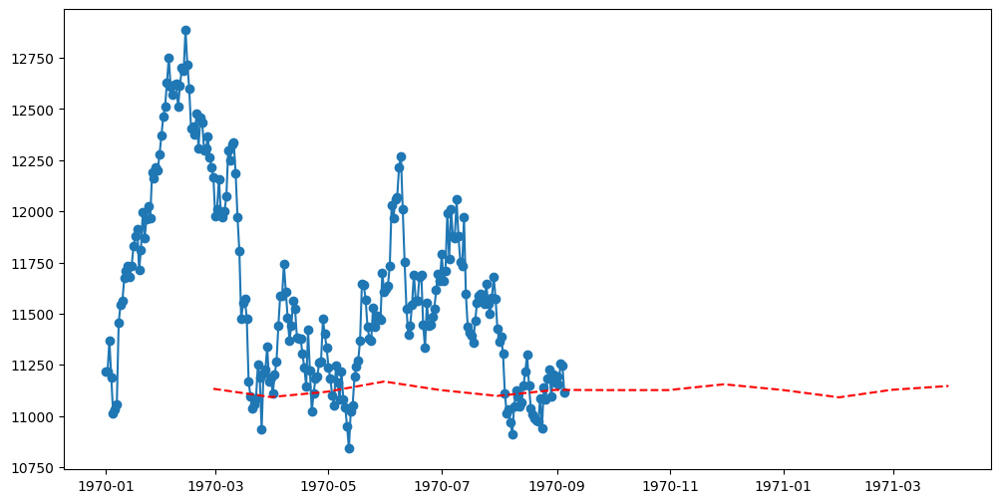

In [ ]:
forecast_steps = 14
forecasted_values = results.forecast(steps=forecast_steps)
plt.figure(figsize=(12, 6))
plt.plot(data_fn.index, data_fn['Open'], label='Original Data', marker='o')
plt.plot(pd.date_range(start=data_fn.index[-1], periods=forecast_steps + 1, freq='M')[1:], forecasted_values, label='Forecast', linestyle='--', color='red')
None

# Задание 10
Загрузить в блокнот изображение логотипа компании.
Выполнить с изображением 3-4 операции, используя любые
функции из библиотеки OpenCV (кроме изменения контраста и
яркости).



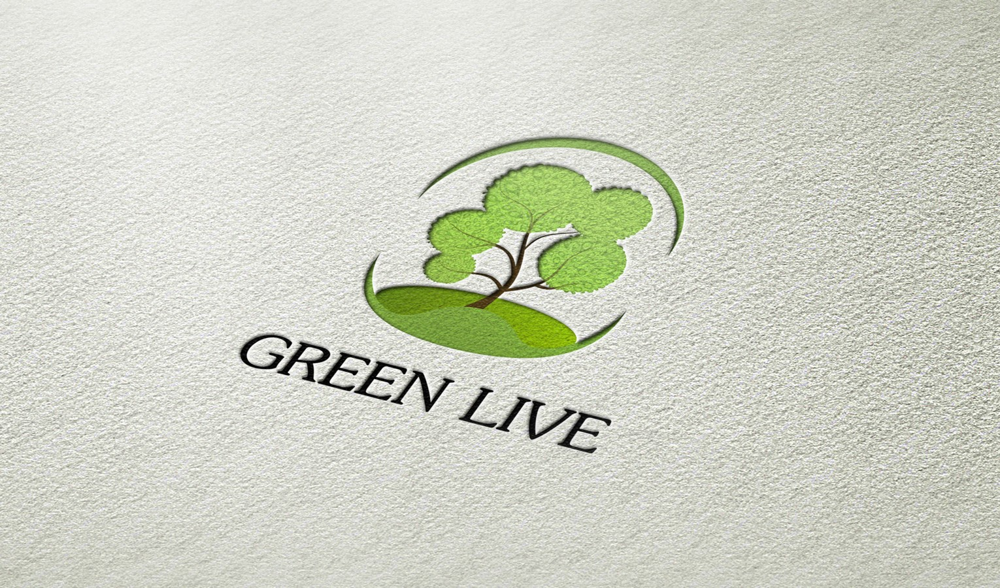

In [ ]:
response = urlopen("http://rs-design.su/wp-content/uploads/2014/05/GREENLIVE-03.jpg")
image_array = np.asarray(bytearray(response.read()), dtype=np.uint8)
image = cv2.imdecode(image_array, cv2.IMREAD_COLOR)
cv2_imshow(image)

Уменьшим изображение, сохранив пропорции

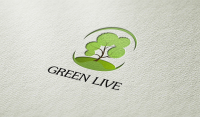

In [ ]:
final_wide = 200
r = float(final_wide) / image.shape[1]
dim = (final_wide, int(image.shape[0] * r))

resized = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
cv2_imshow(resized)

Повернем изображение

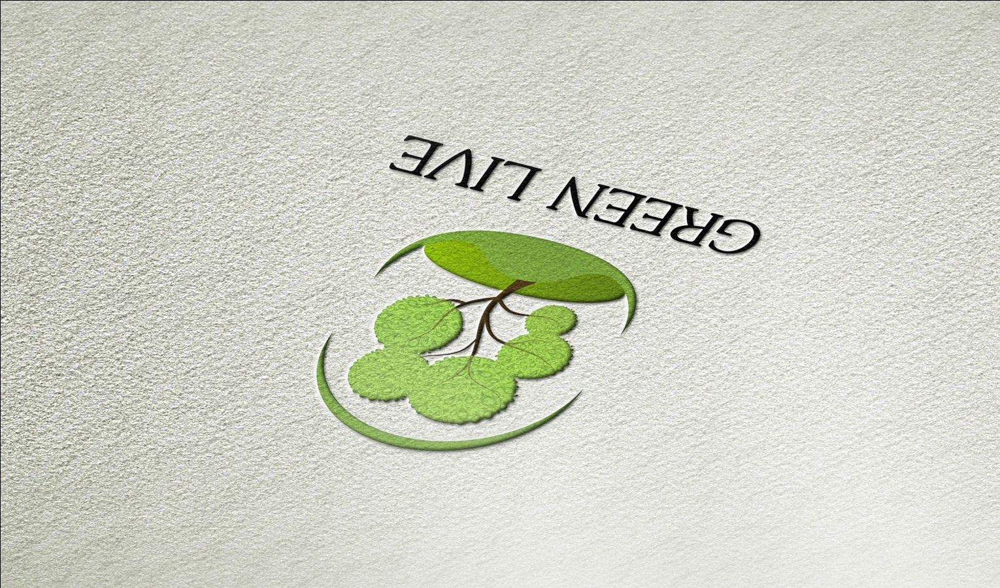

In [ ]:
(h, w) = image.shape[:2]
center = (w / 2, h / 2)


M = cv2.getRotationMatrix2D(center, 180, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
cv2_imshow(rotated)

Преобразуем из RGB в HSV

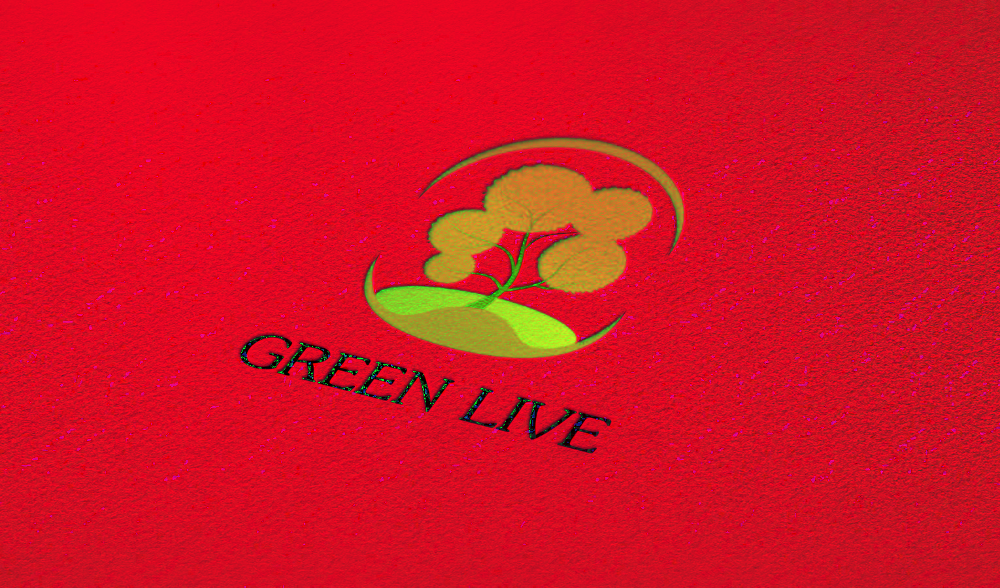

In [ ]:
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
cv2_imshow(hsv_image)

Попробуем выделить границы

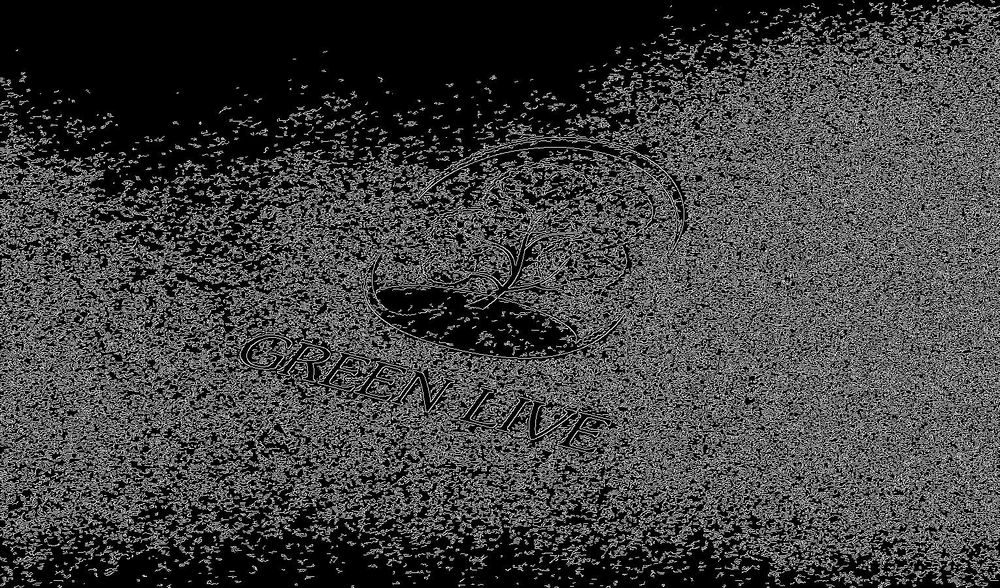

In [ ]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(gray_image, 100, 200)
cv2_imshow(edges)